In [ ]:
### Analiza recenziilor despre instrumente muzicale  - date extrase de pe Amazon

In [2]:
# 1. Importarea bibliotecilor necesare
import nltk # Natural Language Toolkit - analiza si procesarea textului
from nltk.corpus import stopwords # stopwords ofera o lista de cuvinte comune de sfarsit
from nltk.tokenize import word_tokenize # word_tokenize este folosit pt a imparti textul in cuvinte si tokens
from nltk.probability import FreqDist # FreqDist - distributii de frecventa a cuvintelor
from nltk.sentiment import SentimentIntensityAnalyzer # analiza de sentiment asupra textului - ofera un scor al sentimentului - pozitiv, negativ sau neutru
import pandas as pd # manipularea si procesarea datelor
import matplotlib.pyplot as plt # vizualizarea datelor - crearea de grafice (bar chart, line etc)
from collections import Counter # numararea cuvintelor frecvente
import re # procesarea si extragerea textului
from nltk.stem import PorterStemmer # Stemmatizarea textului
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split # Impartirea pe set de antrenare si set de testare
from sklearn.feature_extraction.text import TfidfVectorizer # Vectorizarea textului
from sklearn.naive_bayes import MultinomialNB # Clasificatorul Naive Bayes
from sklearn.metrics import classification_report, accuracy_score
from sklearn.svm import SVC # Support Vector Machine

In [3]:
# 2. Incarcarea datelor despre recenzii
df = pd.read_csv("Musical_instruments_reviews.csv")
# Afisarea primelor 5 randuri
df.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [4]:
# Afisarea informatiilor despre coloane
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10261 entries, 0 to 10260
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   reviewerID      10261 non-null  object
 1   asin            10261 non-null  object
 2   reviewerName    10234 non-null  object
 3   helpful         10261 non-null  object
 4   reviewText      10254 non-null  object
 5   overall         10261 non-null  int64 
 6   summary         10261 non-null  object
 7   unixReviewTime  10261 non-null  int64 
 8   reviewTime      10261 non-null  object
dtypes: int64(2), object(7)
memory usage: 721.6+ KB
None


In [9]:
## Preprocesarea datelor
# Facem o copie a datelor - pt preprocesare
df_processed = df.copy()

In [10]:
# Verificam daca avem valori lipsa
df_processed.isnull().sum()
# Avem valori lipsa la reviewerName si reviewText
# Vom sterge coloana reviewerName, deoarece nu ne ajuta in analiza, iar pt coloana reviewText vom sterge valorile lipsa


# 0 missing values


reviewerID        0
asin              0
helpful           0
reviewText        7
overall           0
summary           0
unixReviewTime    0
reviewTime        0
dtype: int64

In [7]:
df_processed = df.drop(['reviewerName'], axis=1, inplace=True)

In [11]:
df_processed = df_processed.dropna(subset = ['reviewText'])

In [12]:
print(df_processed.columns)

Index(['reviewerID', 'asin', 'helpful', 'reviewText', 'overall', 'summary',
       'unixReviewTime', 'reviewTime'],
      dtype='object')


In [13]:
# Concatenam reviewText si summary
df_processed['reviews']=df_processed['reviewText']+df_processed['summary']
df_processed=df_processed.drop(['reviewText', 'summary'], axis=1)
df_processed.head()


,reviewerID,asin,helpful,overall,unixReviewTime,reviewTime,reviews
0,A2IBPI20UZIR0U,1384719342,"[0, 0]",5,1393545600,"02 28, 2014","Not much to write about here, but it does exac..."
1,A14VAT5EAX3D9S,1384719342,"[13, 14]",5,1363392000,"03 16, 2013",The product does exactly as it should and is q...
2,A195EZSQDW3E21,1384719342,"[1, 1]",5,1377648000,"08 28, 2013",The primary job of this device is to block the...
3,A2C00NNG1ZQQG2,1384719342,"[0, 0]",5,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...
4,A94QU4C90B1AX,1384719342,"[0, 0]",5,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...


In [15]:
# Coloana reviewTime - split 
new = df_processed["reviewTime"].str.split(",", n = 1, expand = True)
# # Construim o noua coloana separata pt an
df_processed["reviewYear"]= new[1]
df_processed.head()

,reviewerID,asin,helpful,overall,unixReviewTime,reviewTime,reviews,reviewYear
0,A2IBPI20UZIR0U,1384719342,"[0, 0]",5,1393545600,"02 28, 2014","Not much to write about here, but it does exac...",2014
1,A14VAT5EAX3D9S,1384719342,"[13, 14]",5,1363392000,"03 16, 2013",The product does exactly as it should and is q...,2013
2,A195EZSQDW3E21,1384719342,"[1, 1]",5,1377648000,"08 28, 2013",The primary job of this device is to block the...,2013
3,A2C00NNG1ZQQG2,1384719342,"[0, 0]",5,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...,2014
4,A94QU4C90B1AX,1384719342,"[0, 0]",5,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...,2014


In [16]:
# Stergem coloana reviewTime, unixReviewTime si helpful
df_processed = df_processed.drop(['reviewTime', 'unixReviewTime', 'helpful'], axis=1)

In [17]:
# Crearea coloanei "sentiment"
# Distributia categoriei conform coloanei "overall"
df_processed['overall'].value_counts()
# Observam ca cele mai multe rating-uri sunt de 5 sau de 4

5    6932
4    2083
3     772
2     250
1     217
Name: overall, dtype: int64

In [18]:
def f(row):
    if row['overall'] == 3:
        val = 'Neutral'
    elif row['overall'] == 1 or row['overall'] == 2:
        val = 'Negative'
    elif row['overall'] == 4 or row['overall'] == 5:
        val = 'Positive'
    else:
        val = -1
    return val


In [19]:
#Aplicam functia pe noua coloana 'sentiment'
df_processed['sentiment'] = df_processed.apply(f, axis=1)
df_processed.head()

,reviewerID,asin,overall,reviews,reviewYear,sentiment
0,A2IBPI20UZIR0U,1384719342,5,"Not much to write about here, but it does exac...",2014,Positive
1,A14VAT5EAX3D9S,1384719342,5,The product does exactly as it should and is q...,2013,Positive
2,A195EZSQDW3E21,1384719342,5,The primary job of this device is to block the...,2013,Positive
3,A2C00NNG1ZQQG2,1384719342,5,Nice windscreen protects my MXL mic and preven...,2014,Positive
4,A94QU4C90B1AX,1384719342,5,This pop filter is great. It looks and perform...,2014,Positive


In [20]:
df_processed['sentiment'].value_counts()
# Cele mai multe rating-uri sunt pozitive

Positive    9015
Neutral      772
Negative     467
Name: sentiment, dtype: int64

In [21]:
df_processed.head()

,reviewerID,asin,overall,reviews,reviewYear,sentiment
0,A2IBPI20UZIR0U,1384719342,5,"Not much to write about here, but it does exac...",2014,Positive
1,A14VAT5EAX3D9S,1384719342,5,The product does exactly as it should and is q...,2013,Positive
2,A195EZSQDW3E21,1384719342,5,The primary job of this device is to block the...,2013,Positive
3,A2C00NNG1ZQQG2,1384719342,5,Nice windscreen protects my MXL mic and preven...,2014,Positive
4,A94QU4C90B1AX,1384719342,5,This pop filter is great. It looks and perform...,2014,Positive


In [22]:
# Definim o functie pentru preprocesarea textului
import string
def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [23]:
df_processed['reviews']=df_processed['reviews'].apply(lambda x:review_cleaning(x))
df_processed.head()

,reviewerID,asin,overall,reviews,reviewYear,sentiment
0,A2IBPI20UZIR0U,1384719342,5,not much to write about here but it does exact...,2014,Positive
1,A14VAT5EAX3D9S,1384719342,5,the product does exactly as it should and is q...,2013,Positive
2,A195EZSQDW3E21,1384719342,5,the primary job of this device is to block the...,2013,Positive
3,A2C00NNG1ZQQG2,1384719342,5,nice windscreen protects my mxl mic and preven...,2014,Positive
4,A94QU4C90B1AX,1384719342,5,this pop filter is great it looks and performs...,2014,Positive


In [24]:
print(df_processed.columns)

Index(['reviewerID', 'asin', 'overall', 'reviews', 'reviewYear', 'sentiment'], dtype='object')


In [25]:
print(df_processed.shape)

(10254, 6)


In [26]:
# Stergerea stop-words
stop_words = ['the', 'and', 're', 'are', 'this', 'of', 'is', 'you', 'we', 'about', 'very', "don't", "that'll", 'my', 'where', 'than', 'as', 'how', 'been', 'which',
              'there', 'own', 'below', 'further', 'with', 'few', 'it', 'at', 'after', 'because', 'those', 'all', 'had', 'have', 'does', 'to', 'that', 'but', 'what',
             'its', 'did', 'not', 'would', 'here', 'out', 'should', 'because', 'otherwise', 'one', 'amp', 'also', 'even',
             'really', 'much', 'using', 'get', 'using', 'could', 'around','way', 'thing', 'something', 'want','make', 'les paul', 'jim dunlop']
df_processed['reviews'] = df_processed['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
df_processed.head()
        

,reviewerID,asin,overall,reviews,reviewYear,sentiment
0,A2IBPI20UZIR0U,1384719342,5,write exactly supposed filters pop sounds now ...,2014,Positive
1,A14VAT5EAX3D9S,1384719342,5,product exactly quite affordablei realized was...,2013,Positive
2,A195EZSQDW3E21,1384719342,5,primary job device block breath produce a popp...,2013,Positive
3,A2C00NNG1ZQQG2,1384719342,5,nice windscreen protects mxl mic prevents pops...,2014,Positive
4,A94QU4C90B1AX,1384719342,5,pop filter great looks performs like a studio ...,2014,Positive


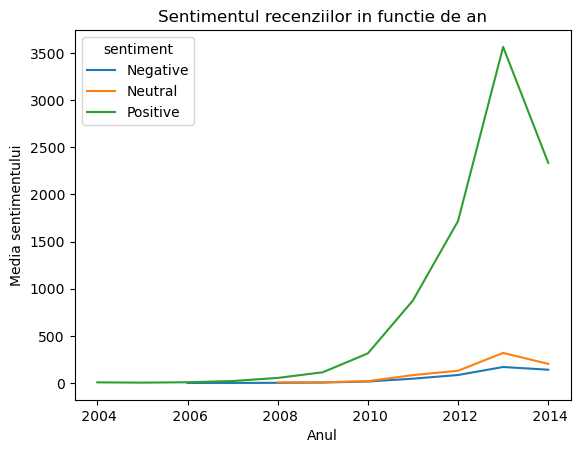

In [27]:
# Year vs Sentiment count
df_processed.groupby(['reviewYear','sentiment'])['sentiment'].count().unstack().plot(legend=True)
plt.title('Sentimentul recenziilor in functie de an')
plt.xlabel('Anul')
plt.ylabel('Media sentimentului')
plt.show()

In [64]:
pip install textblob

Note: you may need to restart the kernel to use updated packages.


In [28]:
# Polaritate: Textblob pt rata de sentiment
from textblob import TextBlob
df_processed['polarity'] = df_processed['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)
# [-1,1] -> -1 polaritate negativa, 1 pozitiva

In [29]:
# Lungimea recenziilor
df_processed['review_len'] = df_processed['reviews'].astype(str).apply(len)

In [30]:
# Lungimea cuvintelor
df_processed['word_count'] = df_processed['reviews'].apply(lambda x: len(str(x).split()))
df_processed.head()

,reviewerID,asin,overall,reviews,reviewYear,sentiment,polarity,review_len,word_count
0,A2IBPI20UZIR0U,1384719342,5,write exactly supposed filters pop sounds now ...,2014,Positive,0.320000,171,27
1,A14VAT5EAX3D9S,1384719342,5,product exactly quite affordablei realized was...,2013,Positive,0.014286,385,66
2,A195EZSQDW3E21,1384719342,5,primary job device block breath produce a popp...,2013,Positive,0.167500,333,53
3,A2C00NNG1ZQQG2,1384719342,5,nice windscreen protects mxl mic prevents pops...,2014,Positive,0.200000,180,25
4,A94QU4C90B1AX,1384719342,5,pop filter great looks performs like a studio ...,2014,Positive,0.650000,155,26


In [253]:
pip install pandas plotly

Note: you may need to restart the kernel to use updated packages.


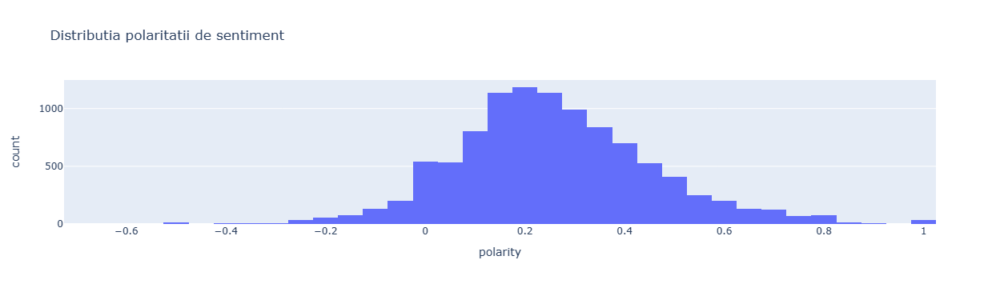

In [31]:
import pandas as pd
import plotly.express as px

# Distributia polaritatii de sentiment

# Converim coloana 'polarity' intr-un Data Frame
df_polarity = pd.DataFrame({'polarity': df_processed['polarity']})

# Afisam histograma cu ajutorul Plotly Express
fig = px.histogram(df_polarity, x='polarity', nbins=50, title='Distributia polaritatii de sentiment')

fig.show()
# Polaritatea de sentiment are o distributie normala


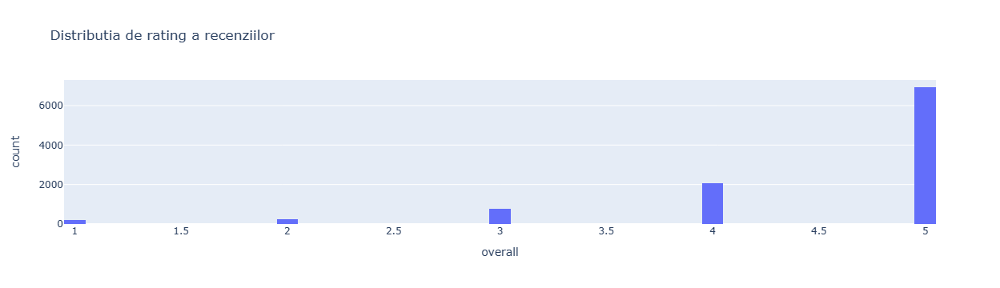

In [32]:
# Distributia rating-ului recenziilor
# Convertim coloana 'overall' intr-un Data Frame
df_overall = pd.DataFrame({'overall': df_processed['overall']})

# Afisam histograma cu ajutorul Plotly Express
fig = px.histogram(df_overall, x='overall', nbins=50, title='Distributia de rating a recenziilor')

fig.show()
# Cele mai multe recenzii au avut nota 5


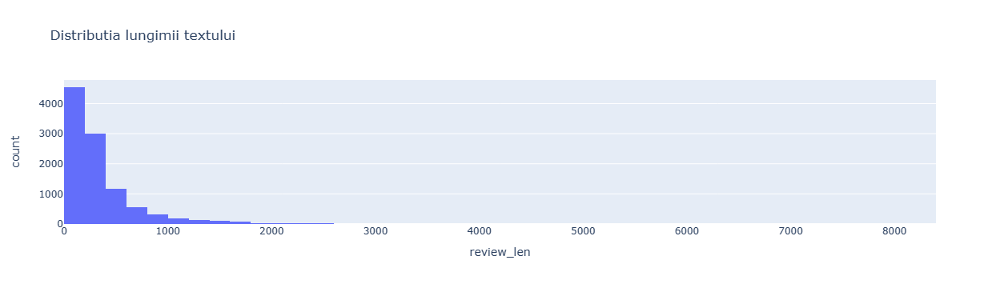

In [33]:
# Distributia lungimii textului
# Convertim coloana review_len intr-un Data Frame
df_review_len = pd.DataFrame({'review_len': df_processed['review_len']})

# Afisam histograma cu ajutorul Plotly Express
fig = px.histogram(df_review_len, x='review_len', nbins=50, title='Distributia lungimii textului')

fig.show()

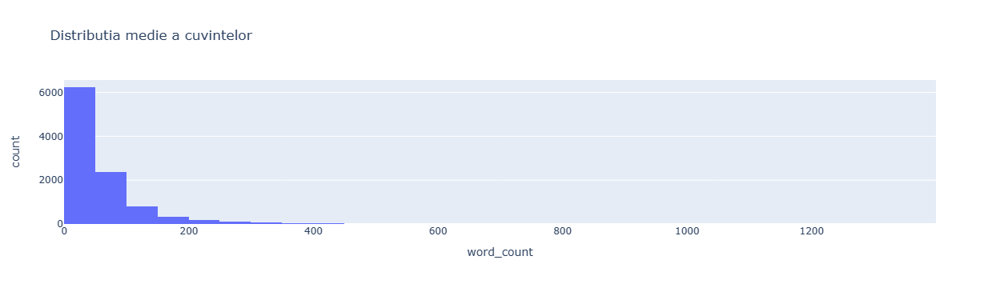

In [34]:
# Distributia medie a cuvintelor
# Convertim coloana 'word_count' intr-un Data Frame
df_word_count = pd.DataFrame({'word_count': df_processed['word_count']})

#Afisam histograma cu ajutorul Plotly Express
fig = px.histogram(df_word_count, x='word_count', nbins=50, title='Distributia medie a cuvintelor')

fig.show()

In [54]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Oana\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

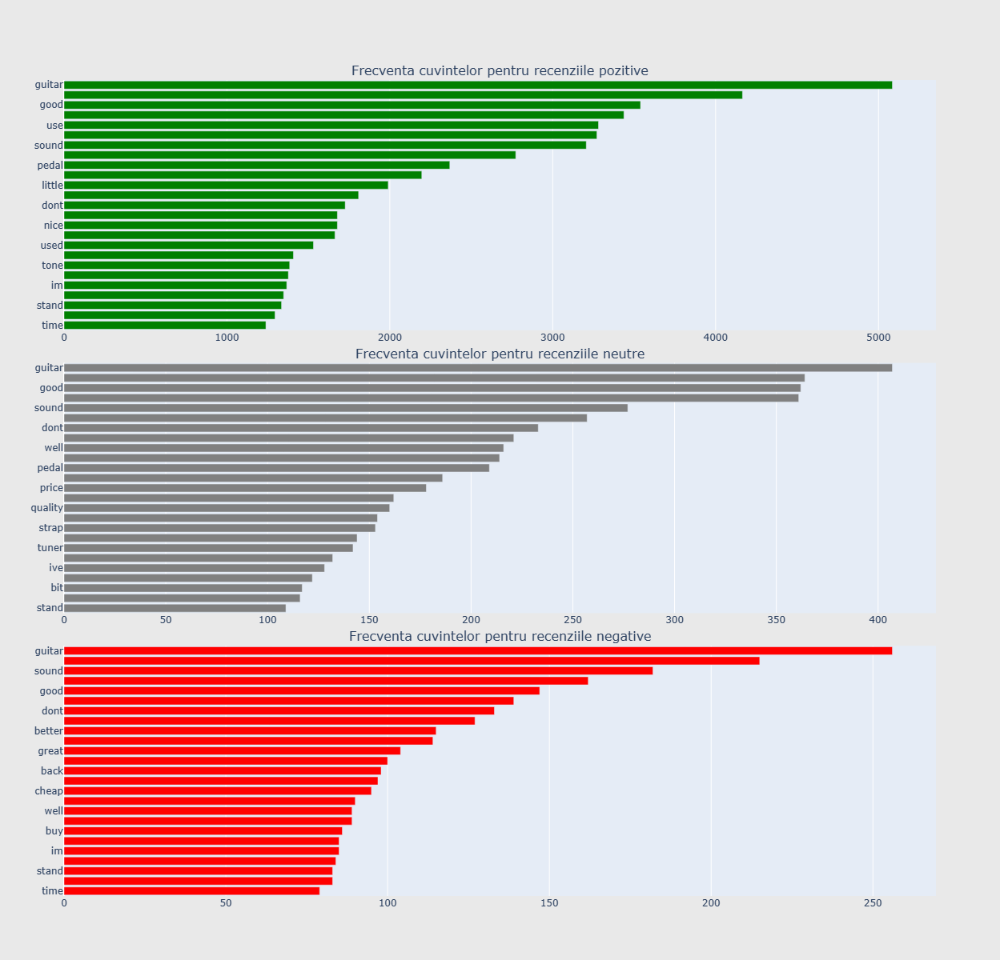

In [35]:
# MONOGRAME
from collections import defaultdict
import pandas as pd
from nltk.corpus import stopwords
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import iplot

# Filter data
review_pos = df_processed[df_processed["sentiment"] == 'Positive'].dropna()
review_neu = df_processed[df_processed["sentiment"] == 'Neutral'].dropna()
review_neg = df_processed[df_processed["sentiment"] == 'Negative'].dropna()

# Custom function for ngram generation
def generate_ngrams(text, n_gram=1):
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in text.lower().split(" ") if token != "" if token not in stop_words]
    ngrams = zip(*[tokens[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

# Custom function for horizontal bar chart
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation='h',
        marker=dict(
            color=color,
        ),
    )
    return trace

# Get the bar chart from positive reviews
freq_dict = defaultdict(int)
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

# Get the bar chart from neutral reviews
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

# Get the bar chart from negative reviews
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')

# Creating two subplots
fig = make_subplots(rows=3, cols=1, vertical_spacing=0.04,
                    subplot_titles=["Frecventa cuvintelor pentru recenziile pozitive", "Frecventa cuvintelor pentru recenziile neutre",
                                    "Frecventa cuvintelor pentru recenziile negative"])
fig.add_trace(trace0, row=1, col=1)
fig.add_trace(trace1, row=2, col=1)
fig.add_trace(trace2, row=3, col=1)
fig.update_layout(height=1200, width=900, paper_bgcolor='rgb(233,233,233)')
iplot(fig, filename='word-plots')


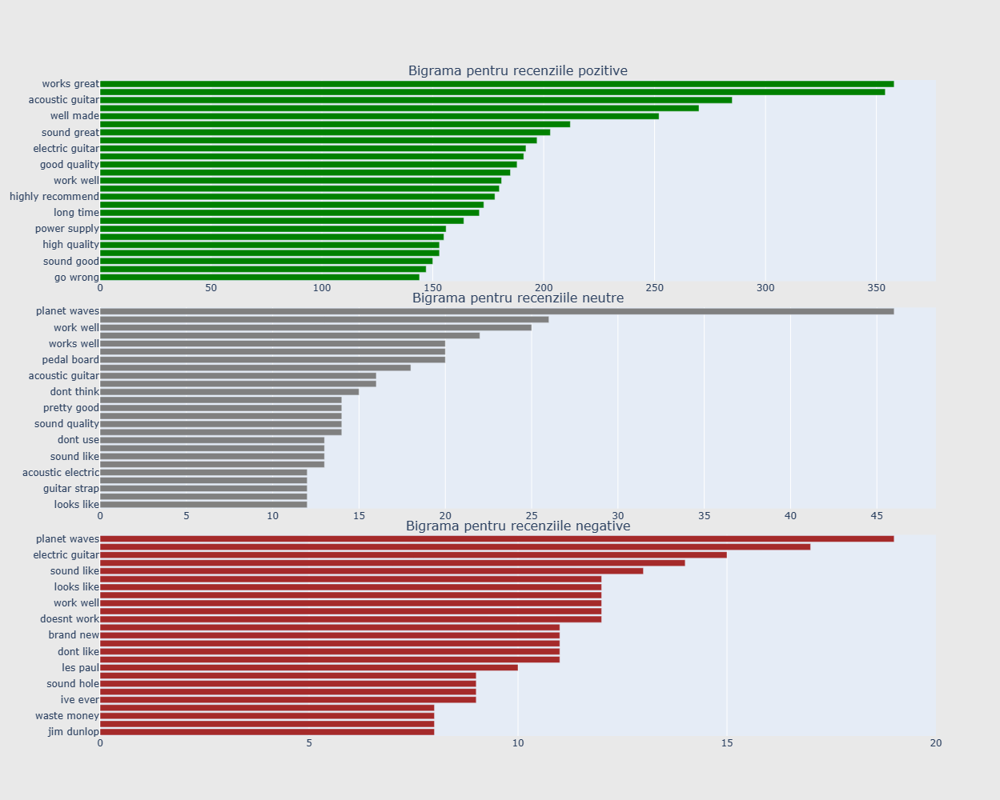

In [36]:
from collections import defaultdict
import pandas as pd
from nltk.corpus import stopwords
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import iplot
# BIGRAME
## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'brown')



# Creating two subplots
fig = make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigrama pentru recenziile pozitive", 
                                          "Bigrama pentru recenziile neutre",
                                          "Bigrama pentru recenziile negative"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)')
iplot(fig, filename='word-plots')


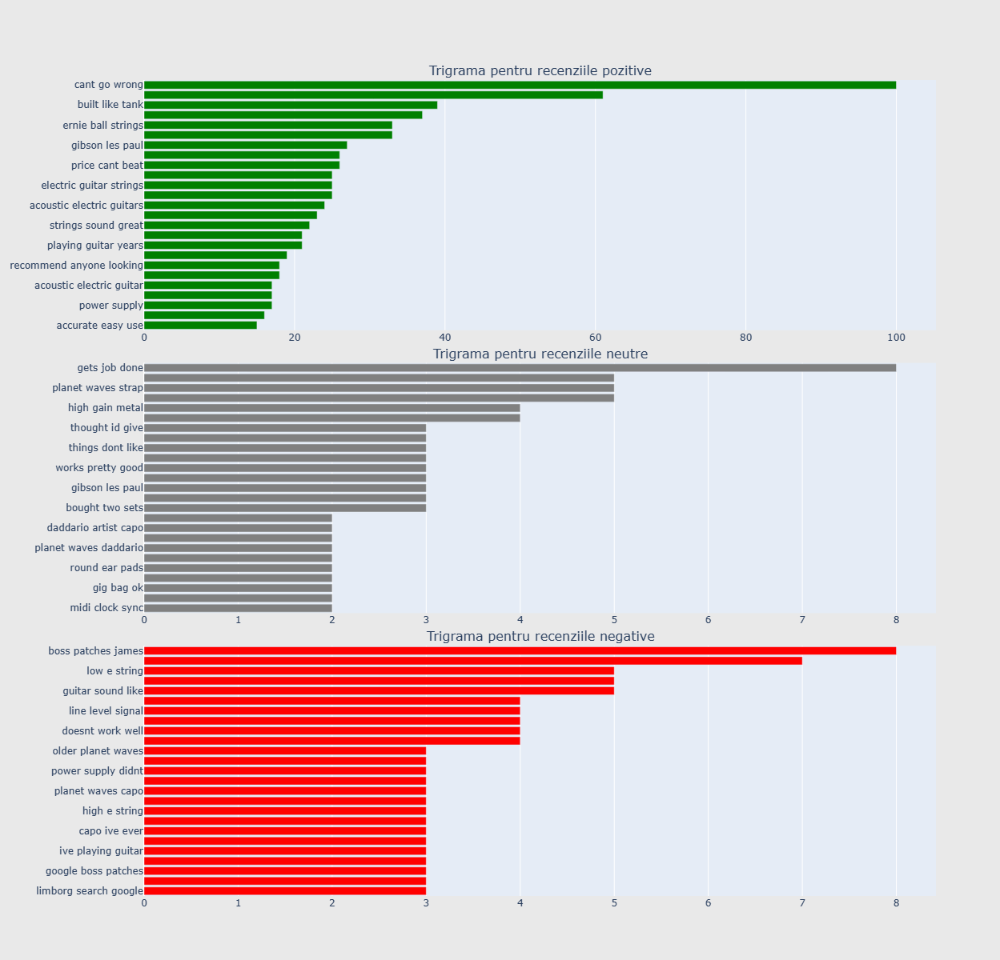

In [37]:
# TRIGRAME
## Get the bar chart from positive reviews ##
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')




# Creating two subplots
fig = make_subplots(rows=3, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Trigrama pentru recenziile pozitive", 
                                          "Trigrama pentru recenziile neutre",
                                          "Trigrama pentru recenziile negative"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=1200, paper_bgcolor='rgb(233,233,233)')
iplot(fig, filename='word-plots')

In [201]:
pip install wordcloud

     -------------------------------------- 300.0/300.0 kB 1.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


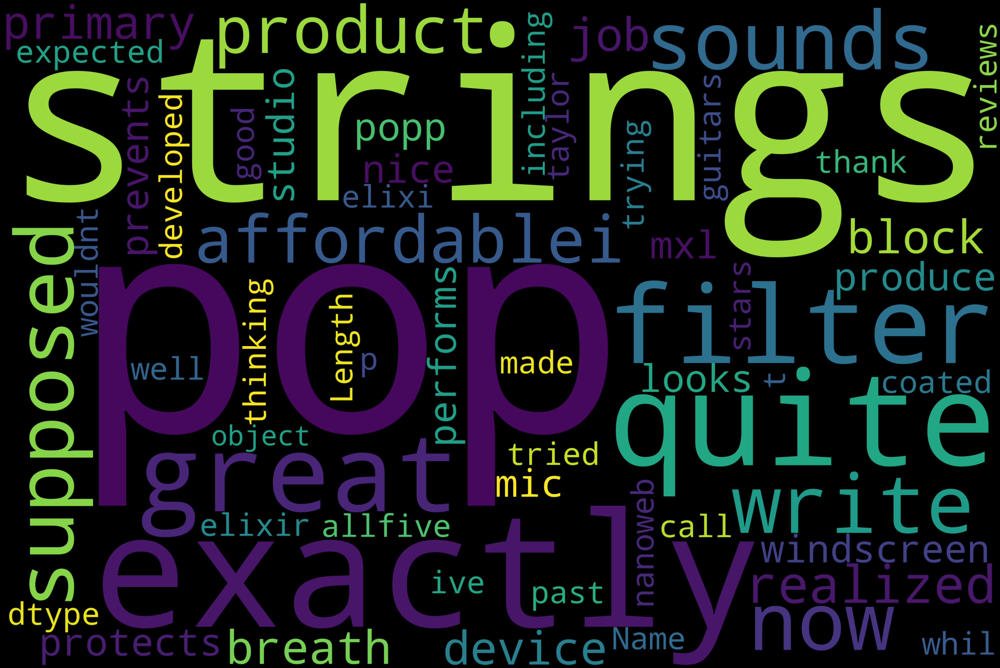

In [38]:
# Word Cloud
# Recenzii pozitive
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
# Cele mai frecvente cuvinte din recenziile pozitive au fost: strings, great, pop, exactly, product etc.

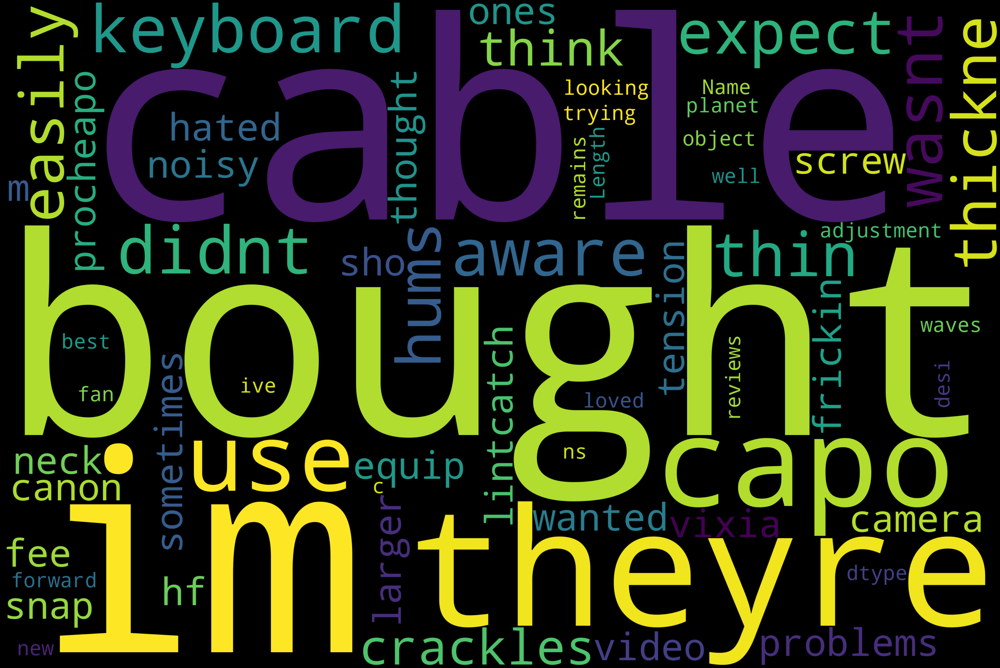

In [39]:
# Recenziile negative
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
# Cele mai frecvente cuvinte din recenziile negative au fost: bought, cable, keyboard etc.

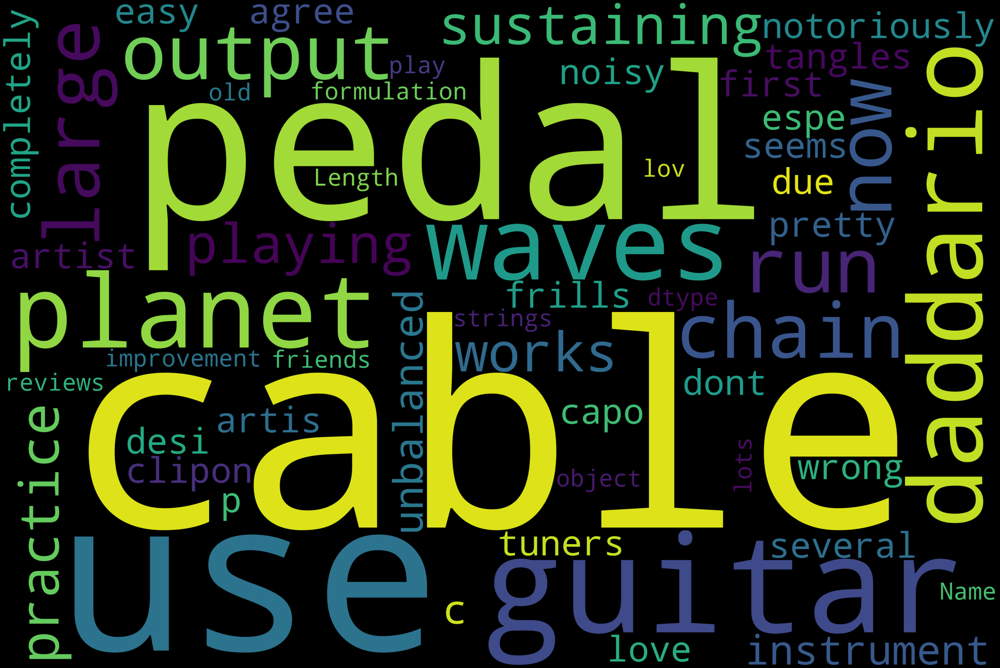

In [40]:
# Recenziile neutre
text = review_neu["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
# Cele mai frecvente cuvinte din recenziile neutre au fost: cable, guitar, pedal, use etc.

In [41]:
# Vom codifica variabila tinta 'sentiment' utilizand LabelEncoder
from sklearn import preprocessing

label_encoder = preprocessing.LabelEncoder() 
  
 
df_processed['sentiment']= label_encoder.fit_transform(df_processed['sentiment']) 
  
df_processed['sentiment'].unique() 

array([2, 1, 0])

In [42]:
df_processed['sentiment'].value_counts()

2    9015
1     772
0     467
Name: sentiment, dtype: int64

In [43]:
# Stemmatizarea recenziilor
# Extragem coloana 'reviews' pentru procesare
review_features=df_processed.copy()
review_features=df_processed[['reviews']].reset_index(drop=True)
review_features.head()

,reviews
0,write exactly supposed filters pop sounds now ...
1,product exactly quite affordablei realized was...
2,primary job device block breath produce a popp...
3,nice windscreen protects mxl mic prevents pops...
4,pop filter great looks performs like a studio ...


In [44]:
# Efectuarea stemmatizarii pe data frame-ul 'reviews'
ps = PorterStemmer()

# impartirea si adaugarea cuvintelor stematizate exceptand stopwords
corpus = []
for i in range(0, len(review_features)):
    review = re.sub('[^a-zA-Z]', ' ', review_features['reviews'][i])
    review = review.split()
    review = [ps.stem(word) for word in review if not word in stop_words]
    review = ' '.join(review)
    corpus.append(review)    

In [45]:
# Initializam TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(max_features = 5000, ngram_range = (2,2))
# Matrice Tfidf
X= tfidf_vectorizer.fit_transform(review_features['reviews'])

In [46]:
X.shape

(10254, 5000)

In [47]:
y = df_processed['sentiment']

In [216]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [48]:
# SMOTE - Metoda de tratare a claselor dezechilibrate
from imblearn.over_sampling import SMOTE
from collections import Counter 
print(f'Original dataset shape : {Counter(y)}')

smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

print(f'Resampled dataset shape {Counter(y_res)}')

Original dataset shape : Counter({2: 9015, 1: 772, 0: 467})
Resampled dataset shape Counter({2: 9015, 1: 9015, 0: 9015})


In [49]:
# Impartirea pe set de antrenare si test de testare - 75:25
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.25, random_state=0)

In [50]:
# Construirea modelului
# Functia de definire a matricii de confuzie
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matricea de confuzie normalizata")
    else:
        print('Matricea de confuzie, fara normalizare')

    thresh = cm.max() / 2.
    for i in range (cm.shape[0]):
        for j in range (cm.shape[1]):
            plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Valoare reala')
    plt.xlabel('Valoare previzionata')

In [51]:
# Selectia modelului
# Alegem modelul cu performanta cea mai mare utilizand Validarea Incrucisata
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import cross_val_score
logreg_cv = LogisticRegression(random_state=0)
dt_cv=DecisionTreeClassifier()
knn_cv=KNeighborsClassifier()
svc_cv=SVC()
nb_cv=BernoulliNB()
cv_dict = {0: 'Logistic Regression', 1: 'Decision Tree',2:'KNN',3:'SVC',4:'Naive Bayes'}
cv_models=[logreg_cv,dt_cv,knn_cv,svc_cv,nb_cv]


for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X, y, cv=10, scoring ='accuracy').mean()))

# Cea mai mare performanta - Regresia logistica : 0.8796

Logistic Regression Test Accuracy: 0.8796567299006324
Decision Tree Test Accuracy: 0.8110995102933487
KNN Test Accuracy: 0.8791693053772643
SVC Test Accuracy: 0.8794617981267532
Naive Bayes Test Accuracy: 0.7948043550610945


In [52]:
# Regresia logistica - Hyperparameters Tuning
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
import numpy as np

param_grid = {'C': np.logspace(-4, 4, 50),
              'penalty': ['l1', 'l2'],
              'max_iter': [100, 500, 5000]}  # Adjust the values as needed

clf = GridSearchCV(LogisticRegression(random_state=0, solver='lbfgs'), param_grid, cv=5, verbose=0, n_jobs=-1)
best_model = clf.fit(X_train, y_train)
print(best_model.best_estimator_)
print("The mean accuracy of the model is:", best_model.score(X_test, y_test))
# 95% acuratete


C:\Users\Oana\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning:


750 fits failed out of a total of 1500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
750 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Oana\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Oana\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\Oana\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 54, in _check_solver
    raise ValueError(
Valu

LogisticRegression(C=10000.0, random_state=0)
The mean accuracy of the model is: 0.9501626737651583


C:\Users\Oana\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [53]:
logreg = LogisticRegression(C=10000.0, random_state=0)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.95


C:\Users\Oana\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Matricea de confuzie, fara normalizare


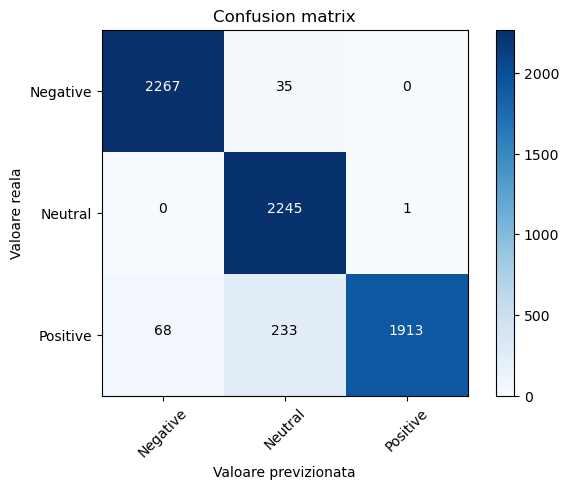

In [54]:
# Metrici de clasificare
from sklearn import metrics
cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes=['Negative','Neutral','Positive']) # 2267 + 2245 + 1913 = 6425 inregistrari previzionate corect 

In [55]:
# Evaluarea modelului
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
print(classification_report(y_test, y_pred))

Accuracy: 0.9501626737651583
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      2302
           1       0.89      1.00      0.94      2246
           2       1.00      0.86      0.93      2214

    accuracy                           0.95      6762
   macro avg       0.95      0.95      0.95      6762
weighted avg       0.95      0.95      0.95      6762



C:\Users\Oana\AppData\Local\Temp\ipykernel_12928\657526498.py:42: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead



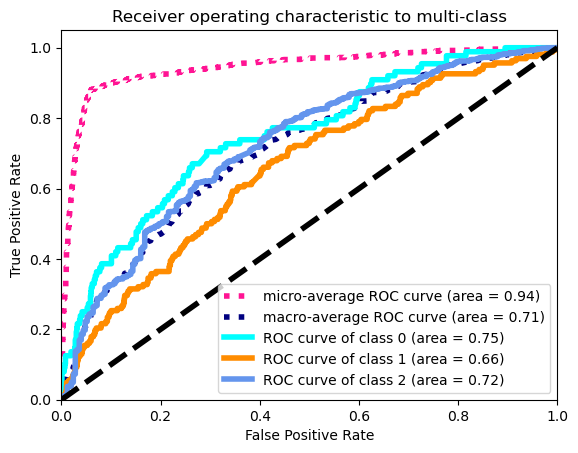

In [56]:
# Curba ROC-AUC - pt a intelege ce clasa a fost previzionata mai bine
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from sklearn import svm
from sklearn.metrics import roc_curve, auc
from scipy import interp
import matplotlib.pyplot as plt
import numpy as np
from itertools import cycle
#Binarizing the target feature
y = label_binarize(y, classes=[0, 1, 2])
n_classes = y.shape[1]

#Train-Test split(80:20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2,
                                                    random_state=0)

#OneVsRestClassifier
classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,
                                 random_state=10))
y_score = classifier.fit(X_train, y_train).decision_function(X_test)

#Computing TPR and FPR
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
# aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=4,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=4)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()
## Având în vedere curba ROC, clasele 2 și 0 au fost clasificate destul de bine, ariile lor de sub curbă avand valori mari.


In [57]:
# Date noi pt predictii
new_data = ['I liked the strings on the guitar', 'I wasnt really satisfied with the product']


In [58]:
# Preprocesam noile date
new_data_preprocessed = [review_cleaning(text) for text in new_data]

In [59]:
# Extragerea caracteristicilor utilizand TfidfVectorizer
new_data_idf = tfidf_vectorizer.transform(new_data_preprocessed).toarray()

In [60]:
# Predictii cu ajutorul modelului ales
new_predictions = best_model.predict(new_data_idf)

In [61]:
# Afisarea predictiilor
print("New predictions:")
print(new_predictions)

New predictions:
[2 1]


In [117]:
print(df_processed[df_processed['sentiment']==0])

           reviewerID        asin  overall  \
15     A2PD27UKAD3Q00  B00005ML71        2   
50     A12ABV9NU02O29  B000068NW5        2   
52     A1L7M2JXN4EZCR  B000068NW5        1   
89     A3UD50M7M72150  B000068NW5        1   
98     A1W3CEEQBJ4GTN  B000068NZC        2   
...               ...         ...      ...   
10171  A2Y2U697SS98E1  B00F2PKRJW        1   
10178   A768OB1LNE356  B00FXKIG5I        2   
10187  A3AOPVQ7EZHTWA  B00GTSM8FW        2   
10189  A1SD1C8XK3Z3V1  B00GTSM8FW        2   
10247  A3VDSGNIS92OVZ  B00J4TBMVO        2   

                                                 reviews  sentiment  \
15     i bought use keyboard i wasnt aware were other...          0   
50     i didnt expect cable be so thin easily thickne...          0   
52     hums crackles i think im having problems equip...          0   
89     im a procheapo i hated theyre noisy cables fee...          0   
98     i bought for canon vixia hf video camera a sho...          0   
...                  